In [1]:
import glob 
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np

In [3]:
path = "/home/hanna/lagrings/satelite_data/"
save_dir = "/home/hanna/ex_2004/"
path = save_dir

In [7]:
files= glob.glob(path+"*.nc")

In [8]:
files = np.sort(files)

In [9]:
files

array(['/home/hanna/ex_2004/2004_10of100.nc',
       '/home/hanna/ex_2004/2004_11of100.nc',
       '/home/hanna/ex_2004/2004_12of100.nc',
       '/home/hanna/ex_2004/2004_13of100.nc',
       '/home/hanna/ex_2004/2004_14of100.nc',
       '/home/hanna/ex_2004/2004_15of100.nc',
       '/home/hanna/ex_2004/2004_16of100.nc',
       '/home/hanna/ex_2004/2004_17of100.nc',
       '/home/hanna/ex_2004/2004_18of100.nc',
       '/home/hanna/ex_2004/2004_19of100.nc',
       '/home/hanna/ex_2004/2004_1of100.nc',
       '/home/hanna/ex_2004/2004_2of100.nc',
       '/home/hanna/ex_2004/2004_3of100.nc',
       '/home/hanna/ex_2004/2004_4of100.nc',
       '/home/hanna/ex_2004/2004_5of100.nc',
       '/home/hanna/ex_2004/2004_6of100.nc',
       '/home/hanna/ex_2004/2004_7of100.nc',
       '/home/hanna/ex_2004/2004_8of100.nc',
       '/home/hanna/ex_2004/2004_9of100.nc'], dtype='<U35')

In [10]:
len(files)

19

In [11]:
def merge_files(files):
    for i, fil in enumerate(files):
        if i == 0:
            ds = xr.open_dataset(fil)
        else:
            try:
                ds = ds.merge( xr.open_dataset(fil) )
            except xr.MergeError:
                #ds = ds.merge( xr.open_dataset(fil))
                print(fil)
            except xr.MemoryError:
                print("Returns pga merge error, read {} files".format(i))
                return ds
    return ds

In [18]:
datasett = merge_files(files)

In [19]:
datasett

<xarray.Dataset>
Dimensions:    (latitude: 81, longitude: 161, time: 1201)
Coordinates:
  * time       (time) datetime64[ns] 2004-04-02 ... 2016-07-20T04:00:00
  * longitude  (longitude) float64 -15.0 -14.75 -14.5 -14.25 ... 24.5 24.75 25.0
  * latitude   (latitude) float64 30.0 30.25 30.5 30.75 ... 49.5 49.75 50.0
Data variables:
    tcc        (time, latitude, longitude) float64 1.0 0.59 1.0 ... 1.0 1.0
    nr_nans    (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0 0.0

In [16]:
# for i in range(1201):
#    max_files['tcc'].isel(time = i).plot()
#    plt.show()

In [27]:
import os

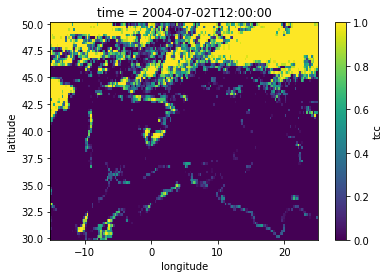

In [28]:
datasett.sel(time = '2004-07-02T12')['tcc'].plot()
plt.savefig(os.path.join(path, "example_artifact.png"))

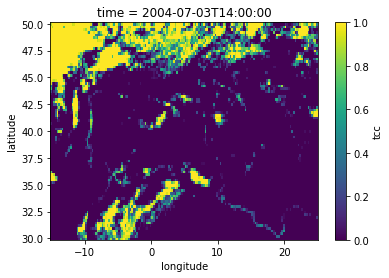

In [25]:
datasett.sel(time = '2004-07-03T14')['tcc'].plot()

# Choosing one year

# Detect the coastline

In [37]:
filter_dir = '/home/hanna/MS-suppl/filters/'
era_dir = '/home/hanna/lagrings/dataERA5_grib/'

filters = glob.glob(filter_dir+'*land*.nc')
era = glob.glob(era_dir + '*.grib')

In [38]:
filters

['/home/hanna/MS-suppl/filters/land_mask_50p_threshhold.nc',
 '/home/hanna/MS-suppl/filters/area_weighted_land_mask.nc']

In [64]:
mask = xr.open_dataset(filters[1])

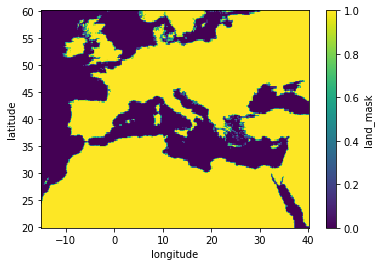

In [65]:
mask['land_mask'].plot()

In [66]:
ll = mask.land_mask.values < 0.4

In [67]:
mask = xr.open_dataset(filters[1])

In [68]:
mask.land_mask.values[mask.land_mask.values < 0.01] = 0
mask.land_mask.values[mask.land_mask.values > 0.99] = 0

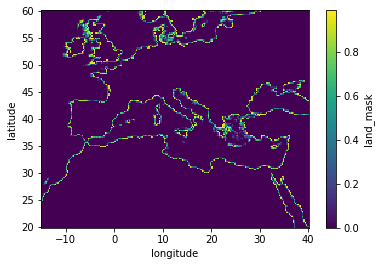

In [69]:
mask['land_mask'].plot()

In [70]:
mask2 = mask.where(mask.latitude + 1/3*mask.longitude < 40, 0)

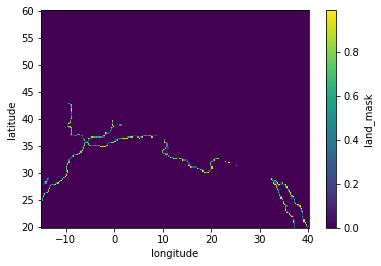

In [71]:
mask2['land_mask'].plot()

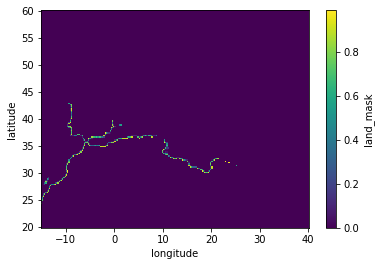

In [72]:
mask2 = mask2.where(mask2.longitude < 30, 0) # this should maybee be updated to 10.
mask2['land_mask'].plot()

In [73]:
mask2 = mask2.where(mask2.land_mask == 0, 1)

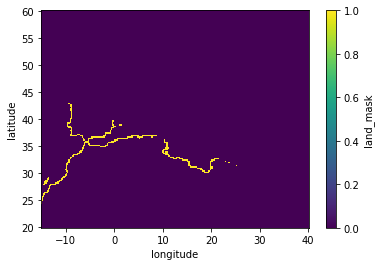

In [74]:
mask2['land_mask'].plot()

In [75]:
subset = mask2.sel(latitude = slice(30,50), longitude = slice(-15, 25))

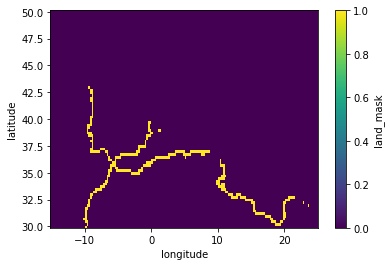

In [76]:
subset['land_mask'].plot()

# Determine treshold for when to remove this

In [77]:
t = 0.8

In [78]:
ex = datasett.sel(time = '2004-07-02T12')['tcc']

In [79]:
ex

<xarray.DataArray 'tcc' (time: 1, latitude: 81, longitude: 161)>
array([[[0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        ...,
        [1.        , 1.        , 1.        , ..., 1.        ,
         1.        , 1.        ],
        [1.        , 1.        , 1.        , ..., 1.        ,
         1.        , 1.        ],
        [1.        , 1.        , 1.        , ..., 1.        ,
         0.86688372, 0.9287397 ]]])
Coordinates:
  * time       (time) datetime64[ns] 2004-07-02T12:00:00
  * longitude  (longitude) float64 -15.0 -14.75 -14.5 -14.25 ... 24.5 24.75 25.0
  * latitude   (latitude) float64 30.0 30.25 30.5 30.75 ... 49.5 49.75 50.0

In [80]:
filt  = subset['land_mask'].values

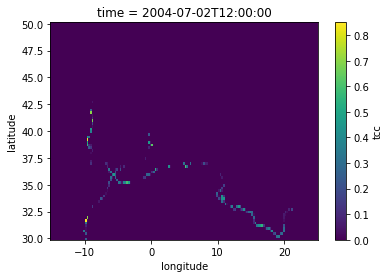

In [85]:
(ex*filt).plot()
plt.savefig(os.path.join(path, 'example_detected_clouds.png'))

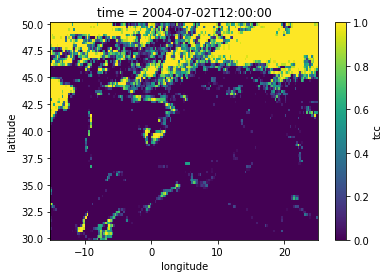

In [86]:
(ex-(filt*ex)).plot()
plt.savefig(os.path.join(path, 'after_removal_of_clouds.png'))

In [83]:
filt.sum()

305.0

In [84]:
nbr_coast_pixels = filt.sum()

# Remove the clouds 

In [90]:
dss

<xarray.Dataset>
Dimensions:    (latitude: 81, longitude: 161, time: 502)
Coordinates:
  * time       (time) datetime64[ns] 2004-06-01T10:00:00 ... 2004-08-12T03:00:00
  * latitude   (latitude) float64 30.0 30.25 30.5 30.75 ... 49.5 49.75 50.0
  * longitude  (longitude) float64 -15.0 -14.75 -14.5 -14.25 ... 24.5 24.75 25.0
    mask       (time) bool False False False False ... False False False False
Data variables:
    tcc        (time, latitude, longitude) float64 1.0 1.0 1.0 ... 1.0 1.0 1.0
    nr_nans    (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0 0.0
    filtered   (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0 0.0
    done       (time, latitude, longitude) float64 1.0 1.0 1.0 ... 1.0 1.0 1.0

In [112]:
fliped_lon = np.flip(dss.tcc.values, axis = 2)
dss['tcc'] = (['time', 'latitude', 'longitude'], fliped_lon)

In [113]:
dss['filtered'] = dss['tcc']*filt

In [114]:
dss

<xarray.Dataset>
Dimensions:      (latitude: 81, longitude: 161, time: 502)
Coordinates:
  * time         (time) datetime64[ns] 2004-06-01T10:00:00 ... 2004-08-12T03:00:00
  * latitude     (latitude) float64 30.0 30.25 30.5 30.75 ... 49.5 49.75 50.0
  * longitude    (longitude) float64 -15.0 -14.75 -14.5 ... 24.5 24.75 25.0
    mask         (time) bool True True True False ... False False False False
Data variables:
    tcc          (time, latitude, longitude) float64 0.8113 0.5859 ... 0.5986
    nr_nans      (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0 0.0
    filtered     (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0 0.0
    done         (time, latitude, longitude) float64 1.0 1.0 1.0 ... 1.0 1.0 1.0
    flipped_lon  (time, latitude, longitude) float64 0.8113 0.5859 ... 0.5986

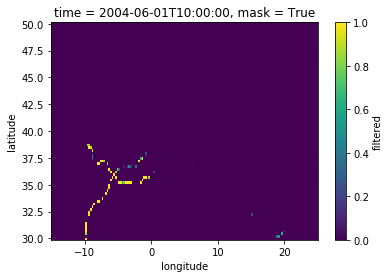

In [115]:
dss['filtered'].isel(time = 0).plot()

In [116]:
frac = dss['filtered'].sum(dim = ['latitude', 'longitude'])/153

In [117]:
mask_array = frac > 0.3

In [118]:
dss.coords['mask'] = (('time'), mask_array)

In [119]:
dss

<xarray.Dataset>
Dimensions:      (latitude: 81, longitude: 161, time: 502)
Coordinates:
  * time         (time) datetime64[ns] 2004-06-01T10:00:00 ... 2004-08-12T03:00:00
  * latitude     (latitude) float64 30.0 30.25 30.5 30.75 ... 49.5 49.75 50.0
  * longitude    (longitude) float64 -15.0 -14.75 -14.5 ... 24.5 24.75 25.0
    mask         (time) bool True True False False ... False False False False
Data variables:
    tcc          (time, latitude, longitude) float64 0.8113 0.5859 ... 0.5986
    nr_nans      (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0 0.0
    filtered     (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0 0.0
    done         (time, latitude, longitude) float64 1.0 1.0 1.0 ... 1.0 1.0 1.0
    flipped_lon  (time, latitude, longitude) float64 0.8113 0.5859 ... 0.5986

In [121]:
dss['done'] = dss.tcc.where(dss.mask == 0, dss.tcc - dss.tcc*dss.filtered)

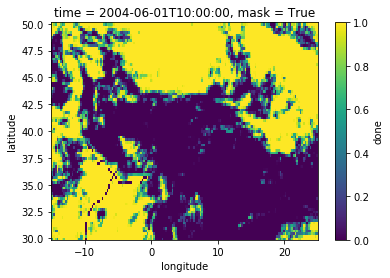

In [122]:
dss['done'].isel(time = 0).plot()

In [123]:
dA = hv.Dataset(dss['done'].isel(time = slice(0, 500)))
images = dA.to(hv.Image, ['longitude', 'latitude']).options(fig_inches=(15, 10), colorbar=True, cmap='viridis')

In [124]:
%output holomap='mp4'

images

:HoloMap   [time]
   :Image   [longitude,latitude]   (done)

In [125]:
title = 'new_example_removed_aritfact_threshhold_50'
renderer = hv.renderer('matplotlib')
renderer.save(images, os.path.join(save_dir, title), 'mp4')